# Lead Scoring Case Study

X Education, an online course provider, struggles with a low lead conversion rate of around 30%. To improve efficiency, they aim to identify 'Hot Leads' with a higher likelihood of conversion, targeting a conversion rate of 80%. Using a dataset of around 9000 leads, my task is to build a logistic regression model to predict lead conversion probabilities. This model will help the sales team prioritize potential leads, enhancing the overall conversion rate.

In [ ]:
# Supressing Warnings
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set(style="whitegrid")

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Model evaluation
from sklearn import metrics
from sklearn.metrics import confusion_matrix, f1_score, roc_auc_score
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import precision_recall_curve

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

### Step 1: Reading and understanding the data

In [ ]:
# Reading the dataset
lead = pd.read_csv("Leads.csv")
lead.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,NaN,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Interested in other courses,Low in Relevance,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,NaN,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Select,Student,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Word Of Mouth,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,Not Sure,No,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,India,Select,Other,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


In [ ]:
lead.tail()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
9235,19d6451e-fcd6-407c-b83b-48e1af805ea9,579564,Landing Page Submission,Direct Traffic,Yes,No,1,8.0,1845,2.67,Email Marked Spam,Saudi Arabia,IT Projects Management,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,High in Relevance,No,No,Potential Lead,Mumbai,02.Medium,01.High,15.0,17.0,No,No,Email Marked Spam
9236,82a7005b-7196-4d56-95ce-a79f937a158d,579546,Landing Page Submission,Direct Traffic,No,No,0,2.0,238,2.00,SMS Sent,India,Media and Advertising,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,wrong number given,Might be,No,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,19.0,No,Yes,SMS Sent
9237,aac550fe-a586-452d-8d3c-f1b62c94e02c,579545,Landing Page Submission,Direct Traffic,Yes,No,0,2.0,199,2.00,SMS Sent,India,Business Administration,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,invalid number,Not Sure,No,No,Potential Lead,Mumbai,02.Medium,01.High,13.0,20.0,No,Yes,SMS Sent
9238,5330a7d1-2f2b-4df4-85d6-64ca2f6b95b9,579538,Landing Page Submission,Google,No,No,1,3.0,499,3.00,SMS Sent,India,Human Resource Management,Online Search,NaN,NaN,No,No,No,No,No,No,No,No,NaN,NaN,No,No,NaN,Other Metro Cities,02.Medium,02.Medium,15.0,16.0,No,No,SMS Sent
9239,571b5c8e-a5b2-4d57-8574-f2ffb06fdeff,579533,Landing Page Submission,Direct Traffic,No,No,1,6.0,1279,3.00,SMS Sent,Bangladesh,Supply Chain Management,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Potential Lead,Other Cities,02.Medium,01.High,15.0,18.0,No,Yes,Modified


In [ ]:
# Let's check the dimensions of the dataframe
lead.shape

(9240, 37)

In [ ]:
# Let's see the type of each column
lead.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

In [ ]:
# Let's check all the column names
lead.columns

Index(['Prospect ID', 'Lead Number', 'Lead Origin', 'Lead Source',
       'Do Not Email', 'Do Not Call', 'Converted', 'TotalVisits',
       'Total Time Spent on Website', 'Page Views Per Visit', 'Last Activity',
       'Country', 'Specialization', 'How did you hear about X Education',
       'What is your current occupation',
       'What matters most to you in choosing a course', 'Search', 'Magazine',
       'Newspaper Article', 'X Education Forums', 'Newspaper',
       'Digital Advertisement', 'Through Recommendations',
       'Receive More Updates About Our Courses', 'Tags', 'Lead Quality',
       'Update me on Supply Chain Content', 'Get updates on DM Content',
       'Lead Profile', 'City', 'Asymmetrique Activity Index',
       'Asymmetrique Profile Index', 'Asymmetrique Activity Score',
       'Asymmetrique Profile Score',
       'I agree to pay the amount through cheque',
       'A free copy of Mastering The Interview', 'Last Notable Activity'],
      dtype='object')

In [ ]:
# let's look at the statistical aspects of the dataframe
lead.describe()

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9240.000000,9240.000000,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,617188.435606,0.385390,3.445238,487.698268,2.362820,14.306252,16.344883
std,23405.995698,0.486714,4.854853,548.021466,2.161418,1.386694,1.811395
min,579533.000000,0.000000,0.000000,0.000000,0.000000,7.000000,11.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000,14.000000,15.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000,14.000000,16.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000,15.000000,18.000000
max,660737.000000,1.000000,251.000000,2272.000000,55.000000,18.000000,20.000000


In [ ]:
# Checking the percentage of missing values
round(100*(lead.isnull().sum()/len(lead.index)), 2)

,0
Prospect ID,0.00
Lead Number,0.00
Lead Origin,0.00
Lead Source,0.39
Do Not Email,0.00
Do Not Call,0.00
Converted,0.00
TotalVisits,1.48
Total Time Spent on Website,0.00
Page Views Per Visit,1.48


### Step 2: Data Preparation

#### Converting some binary variables (Yes/No) to 0/1

In [ ]:
# List of variables to map
varlist = ['Do Not Email','Do Not Call','Search','Magazine','Newspaper Article','X Education Forums','Newspaper',
           'Digital Advertisement','Through Recommendations','Receive More Updates About Our Courses',
           'Update me on Supply Chain Content','Get updates on DM Content','I agree to pay the amount through cheque',
           'A free copy of Mastering The Interview']

# Defining the map function
def binary_map(x):
    return x.map({'Yes':1, 'No':0})

# Applying the function
lead[varlist] = lead[varlist].apply(binary_map)

In [ ]:
lead.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,0,0,0,0.0,0,0.0,Page Visited on Website,NaN,Select,Select,Unemployed,Better Career Prospects,0,0,0,0,0,0,0,0,Interested in other courses,Low in Relevance,0,0,Select,Select,02.Medium,02.Medium,15.0,15.0,0,0,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,0,0,0,5.0,674,2.5,Email Opened,India,Select,Select,Unemployed,Better Career Prospects,0,0,0,0,0,0,0,0,Ringing,NaN,0,0,Select,Select,02.Medium,02.Medium,15.0,15.0,0,0,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,0,0,1,2.0,1532,2.0,Email Opened,India,Business Administration,Select,Student,Better Career Prospects,0,0,0,0,0,0,0,0,Will revert after reading the email,Might be,0,0,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,0,1,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,0,0,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Word Of Mouth,Unemployed,Better Career Prospects,0,0,0,0,0,0,0,0,Ringing,Not Sure,0,0,Select,Mumbai,02.Medium,01.High,13.0,17.0,0,0,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,0,0,1,2.0,1428,1.0,Converted to Lead,India,Select,Other,Unemployed,Better Career Prospects,0,0,0,0,0,0,0,0,Will revert after reading the email,Might be,0,0,Select,Mumbai,02.Medium,01.High,15.0,18.0,0,0,Modified


#### Checking for Outliers

In [ ]:
# Checking for outliers in the continuous variables
out_lead = lead[['TotalVisits','Total Time Spent on Website','Page Views Per Visit','Asymmetrique Activity Score',
                 'Asymmetrique Profile Score']]

In [ ]:
# Checking outliers at 25%, 50%, 75%, 90%, 95% and 99%
out_lead.describe(percentiles=[.25, .50, .75, .90, .95, .99])

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,3.445238,487.698268,2.362820,14.306252,16.344883
std,4.854853,548.021466,2.161418,1.386694,1.811395
min,0.000000,0.000000,0.000000,7.000000,11.000000
25%,1.000000,12.000000,1.000000,14.000000,15.000000
50%,3.000000,248.000000,2.000000,14.000000,16.000000
75%,5.000000,936.000000,3.000000,15.000000,18.000000
90%,7.000000,1380.000000,5.000000,16.000000,19.000000
95%,10.000000,1562.000000,6.000000,17.000000,20.000000
99%,17.000000,1840.610000,9.000000,17.000000,20.000000


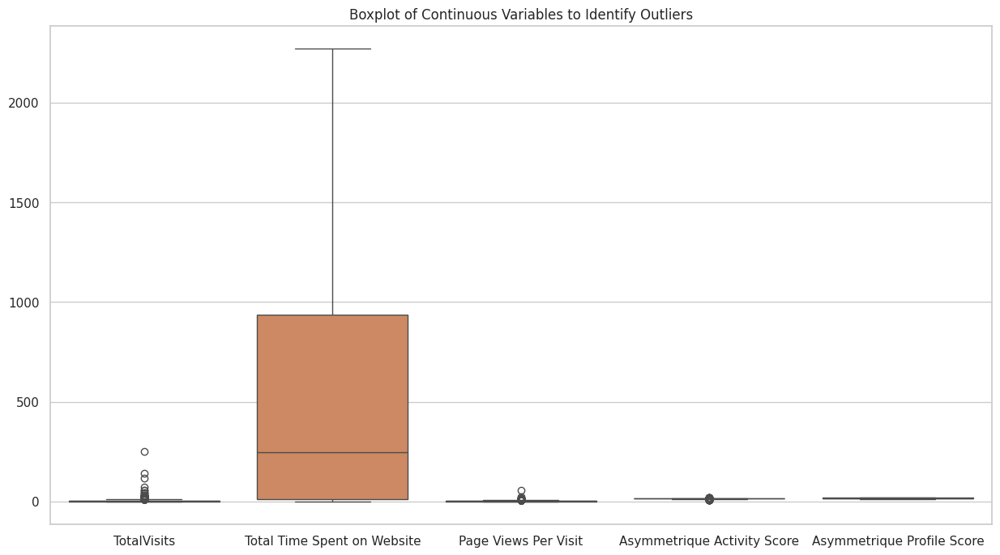

In [ ]:
# Let's visualize these columns for a clearer understanding
plt.figure(figsize=(15,8))
sns.boxplot(data=out_lead)
plt.title('Boxplot of Continuous Variables to Identify Outliers')
plt.show()

- The boxplot visualization indicates that the columns `TotalVisits` and `Page Views` Per Visit contain notable outliers, which require attention and handling

In [ ]:
# Determine the 95th percentile of the Total Visits data
q95 = lead["TotalVisits"].quantile(0.95)

# Cap the outliers at the 95th percentile value
lead["TotalVisits"] = np.where(lead["TotalVisits"] > q95, q95, lead["TotalVisits"])

# Confirm the adjustment
print(lead["TotalVisits"].describe())

count    9103.000000
mean        3.181918
std         2.781834
min         0.000000
25%         1.000000
50%         3.000000
75%         5.000000
max        10.000000
Name: TotalVisits, dtype: float64


In [ ]:
# Determine the 95th percentile of the Page Views Per Visit data
q95_page = lead["Page Views Per Visit"].quantile(0.95)

# Cap the outliers at the 95th percentile value
lead["Page Views Per Visit"] = np.where(lead["Page Views Per Visit"] > q95_page, q95_page, lead["Page Views Per Visit"])

# Confirm the adjustment
print(lead["Page Views Per Visit"].describe())

count    9103.000000
mean        2.258944
std         1.792536
min         0.000000
25%         1.000000
50%         2.000000
75%         3.000000
max         6.000000
Name: Page Views Per Visit, dtype: float64


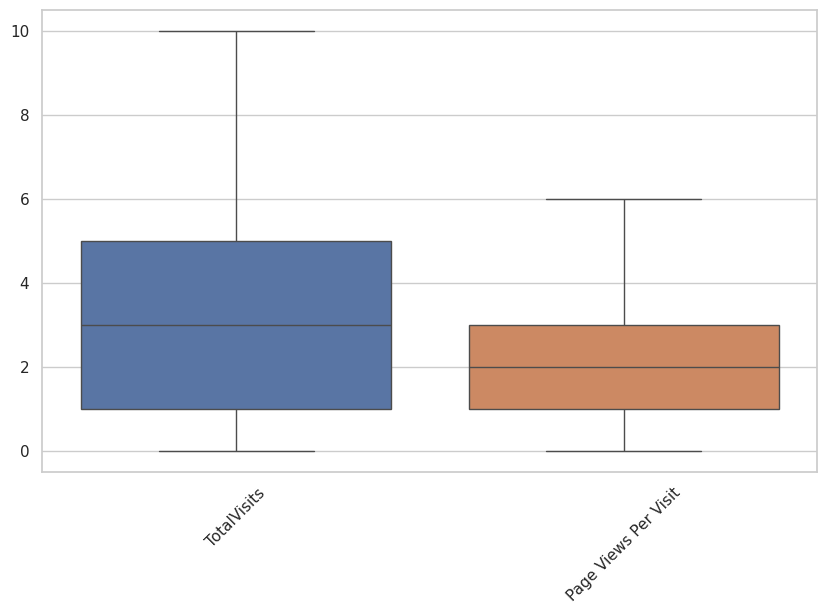

In [ ]:
# Checking the plot again for the absence of outliers
lead_vis = lead[['TotalVisits','Page Views Per Visit']]

plt.figure(figsize=(10,6))
sns.boxplot(data=lead_vis)
plt.xticks(rotation=45)
plt.show()

#### Converting SELECTs into NaNs

In [ ]:
# Listing the categorical variables yet to be encoded
lead.select_dtypes(include='object').info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 16 columns):
 #   Column                                         Non-Null Count  Dtype 
---  ------                                         --------------  ----- 
 0   Prospect ID                                    9240 non-null   object
 1   Lead Origin                                    9240 non-null   object
 2   Lead Source                                    9204 non-null   object
 3   Last Activity                                  9137 non-null   object
 4   Country                                        6779 non-null   object
 5   Specialization                                 7802 non-null   object
 6   How did you hear about X Education             7033 non-null   object
 7   What is your current occupation                6550 non-null   object
 8   What matters most to you in choosing a course  6531 non-null   object
 9   Tags                                           5887 non-null   

In [ ]:
# Checking the labels of the remaining categorical columns
for column in lead.iloc[:,1:].select_dtypes(include='object').columns:
    print(column)
    print('---------------------------------------')
    print(lead[column].value_counts(normalize=True))
    print('---------------------------------------')

Lead Origin
---------------------------------------
Lead Origin
Landing Page Submission    0.528788
API                        0.387446
Lead Add Form              0.077706
Lead Import                0.005952
Quick Add Form             0.000108
Name: proportion, dtype: float64
---------------------------------------
Lead Source
---------------------------------------
Lead Source
Google               0.311604
Direct Traffic       0.276293
Olark Chat           0.190678
Organic Search       0.125380
Reference            0.058018
Welingak Website     0.015428
Referral Sites       0.013581
Facebook             0.005976
bing                 0.000652
google               0.000543
Click2call           0.000435
Press_Release        0.000217
Social Media         0.000217
Live Chat            0.000217
youtubechannel       0.000109
testone              0.000109
Pay per Click Ads    0.000109
welearnblog_Home     0.000109
WeLearn              0.000109
blog                 0.000109
NC_EDM             

In [ ]:
# Converting all the 'Select' to 'NaN' as the user didnt select any option from the list
lead = lead.replace('Select', np.nan)
lead.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   int64  
 5   Do Not Call                                    9240 non-null   int64  
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

#### Checking for Missing Values

In [ ]:
# Adding up the missing values (column-wise)
lead.isnull().sum()

,0
Prospect ID,0
Lead Number,0
Lead Origin,0
Lead Source,36
Do Not Email,0
Do Not Call,0
Converted,0
TotalVisits,137
Total Time Spent on Website,0
Page Views Per Visit,137


In [ ]:
# Checking the percentage of missing values
round(100*(lead.isnull().sum()/len(lead.index)), 2)

,0
Prospect ID,0.00
Lead Number,0.00
Lead Origin,0.00
Lead Source,0.39
Do Not Email,0.00
Do Not Call,0.00
Converted,0.00
TotalVisits,1.48
Total Time Spent on Website,0.00
Page Views Per Visit,1.48


In [ ]:
# Dropping columns that contain more than 70% null values
threshold = lead.shape[0] * 0.30
lead = lead.dropna(axis=1, thresh=threshold)

In [ ]:
# Since the Lead Quality relies on the employee's intuition, it would be safer to replace NaN values with "Not Sure".
lead['Lead Quality'] = lead['Lead Quality'].replace(np.nan, 'Not Sure')

Several columns still have over 40% null values. Due to their high variability, imputing values would be unreliable, so we will remove these columns instead

In [ ]:
# Dropping columns that contain more than 40% null values
threshold1 = lead.shape[0] * 0.60
lead = lead.dropna(axis=1, thresh=threshold1)

In [ ]:
# Since over 95% of the Country column data is 'India', it is reasonable to impute NULL values with 'India'
lead['Country'] = lead['Country'].replace(np.nan, 'India')

# Since the top three specializations have no significant differences, it's best to impute NULLs with 'Other_specialization'
lead['Specialization'] = lead['Specialization'].replace(np.nan, 'Other_specialization')

# Since over 85% of the data is 'Unemployed', it is reasonable to impute NULL values with this category
lead['What is your current occupation'] = lead['What is your current occupation'].replace(np.nan, 'Unemployed')

# Since over 99% of the data is 'Better Career Prospects', imputing NULLs with this value is a safe choice
lead['What matters most to you in choosing a course'] = lead['What matters most to you in choosing a course'].replace(np.nan, 'Better Career Prospects')

# Replacing NULL values in the Tags column with 'Will revert after reading the email' since it constitutes over 35% of the data
lead['Tags'] = lead['Tags'].replace(np.nan, 'Will revert after reading the email')

# For the City column, let's fill in all the NULLs with 'MUMBAI' since it's the predominant value
lead['City'] = lead['City'].replace(np.nan, 'Mumbai')

In [ ]:
# Checking the percentage of missing values in the updated dataframe
round(100*(lead.isnull().sum()/len(lead.index)), 2)

,0
Prospect ID,0.00
Lead Number,0.00
Lead Origin,0.00
Lead Source,0.39
Do Not Email,0.00
Do Not Call,0.00
Converted,0.00
TotalVisits,1.48
Total Time Spent on Website,0.00
Page Views Per Visit,1.48


In [ ]:
# Remaining NULL values are below 2%, so these rows can be dropped
lead.dropna(inplace=True)
lead.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,City,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,0,0,0,0.0,0,0.0,Page Visited on Website,India,Other_specialization,Unemployed,Better Career Prospects,0,0,0,0,0,0,0,0,Interested in other courses,Low in Relevance,0,0,Mumbai,0,0,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,0,0,0,5.0,674,2.5,Email Opened,India,Other_specialization,Unemployed,Better Career Prospects,0,0,0,0,0,0,0,0,Ringing,Not Sure,0,0,Mumbai,0,0,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,0,0,1,2.0,1532,2.0,Email Opened,India,Business Administration,Student,Better Career Prospects,0,0,0,0,0,0,0,0,Will revert after reading the email,Might be,0,0,Mumbai,0,1,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,0,0,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Unemployed,Better Career Prospects,0,0,0,0,0,0,0,0,Ringing,Not Sure,0,0,Mumbai,0,0,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,0,0,1,2.0,1428,1.0,Converted to Lead,India,Other_specialization,Unemployed,Better Career Prospects,0,0,0,0,0,0,0,0,Will revert after reading the email,Might be,0,0,Mumbai,0,0,Modified


In [ ]:
# Verifying that there are no missing values remaining in the dataset
lead.isnull().sum()

,0
Prospect ID,0
Lead Number,0
Lead Origin,0
Lead Source,0
Do Not Email,0
Do Not Call,0
Converted,0
TotalVisits,0
Total Time Spent on Website,0
Page Views Per Visit,0


In [ ]:
# Identifying if any duplicate rows are in the dataset
lead.duplicated().sum()

0

- Our dataset is free of any duplicate entries.

### Step 3: Visualizing the Data

In [ ]:
# Let's begin by examining the target variable to determine if there's any imbalance in the data distribution
lead['Converted'].value_counts(normalize=True)

,proportion
Converted,
0,0.621446
1,0.378554


- Both data classes are well-represented, so we are ready to proceed with further analysis.

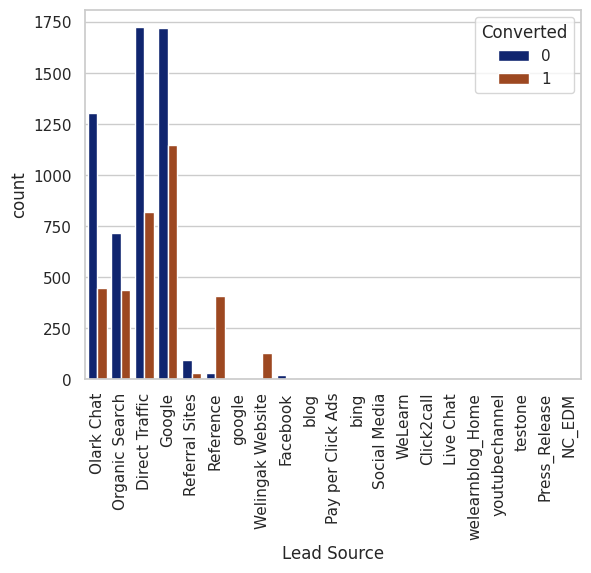

In [ ]:
# Plotting the count of leads by source
sns.countplot(x="Lead Source", hue="Converted", data= lead, palette='dark')
plt.xticks(rotation='vertical')
plt.show()

In [ ]:
# The negligible lead counts from various sources can be combined into "Others" category for clearer visualization and analysis
lead['Lead Source'] = lead['Lead Source'].replace(['Click2call', 'Live Chat', 'NC_EDM', 'Pay per Click Ads', 'Press_Release',
                                                   'Social Media', 'WeLearn', 'bing', 'blog', 'testone', 'welearnblog_Home',
                                                   'youtubechannel'], 'Other_Source')

lead['Lead Source'] = lead['Lead Source'].replace('google', 'Google')

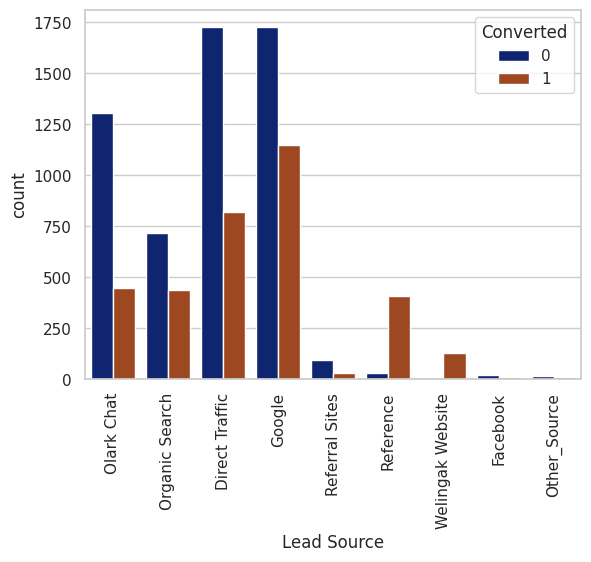

In [ ]:
# Plotting Lead Source again
sns.countplot(x="Lead Source", hue="Converted", data=lead, palette='dark')
plt.xticks(rotation='vertical')
plt.show()

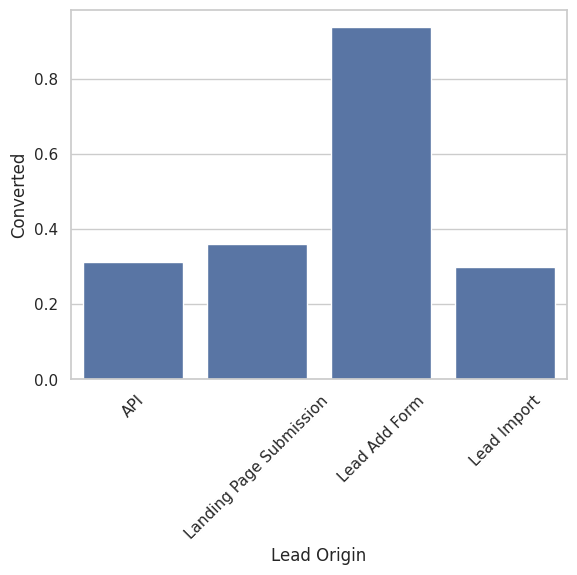

In [ ]:
# Plotting the count of leads by orgin
sns.barplot(x="Lead Origin", y="Converted", data=lead, ci=None)
plt.xticks(rotation=45)
plt.show()

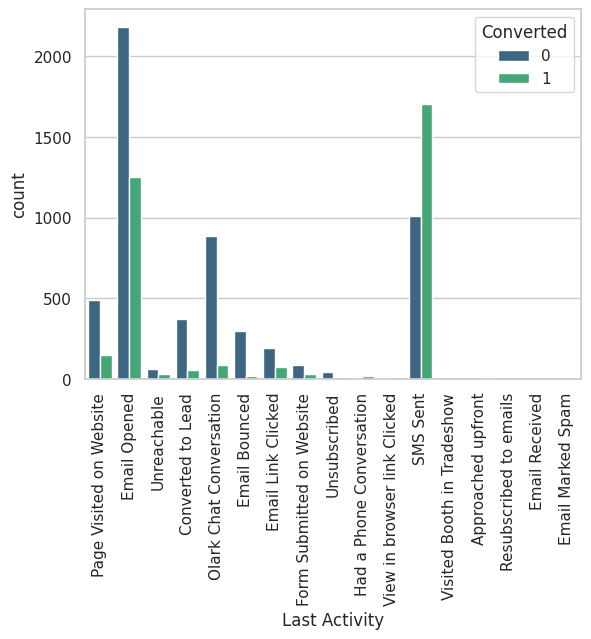

In [ ]:
# Plotting Last Activity
sns.countplot(x='Last Activity', hue='Converted', data=lead, palette='viridis')
plt.xticks(rotation='vertical')
plt.show()

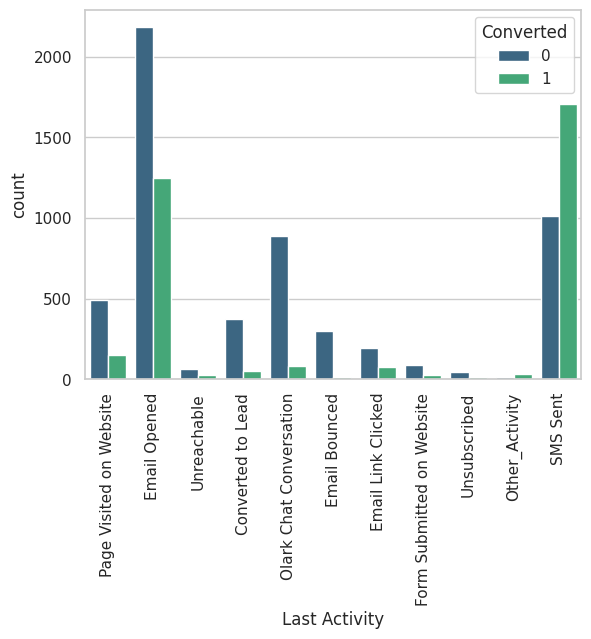

In [ ]:
# Converting all the low count categories to 'Others' category
lead['Last Activity'] = lead['Last Activity'].replace(['Had a Phone Conversation', 'View in browser link Clicked',
                                                       'Visited Booth in Tradeshow', 'Approached upfront',
                                                       'Resubscribed to emails','Email Received', 'Email Marked Spam'],
                                                      'Other_Activity')

# lets plot Last Activity again
sns.countplot(x="Last Activity", hue="Converted", data=lead, palette='viridis')
plt.xticks(rotation='vertical')
plt.show()

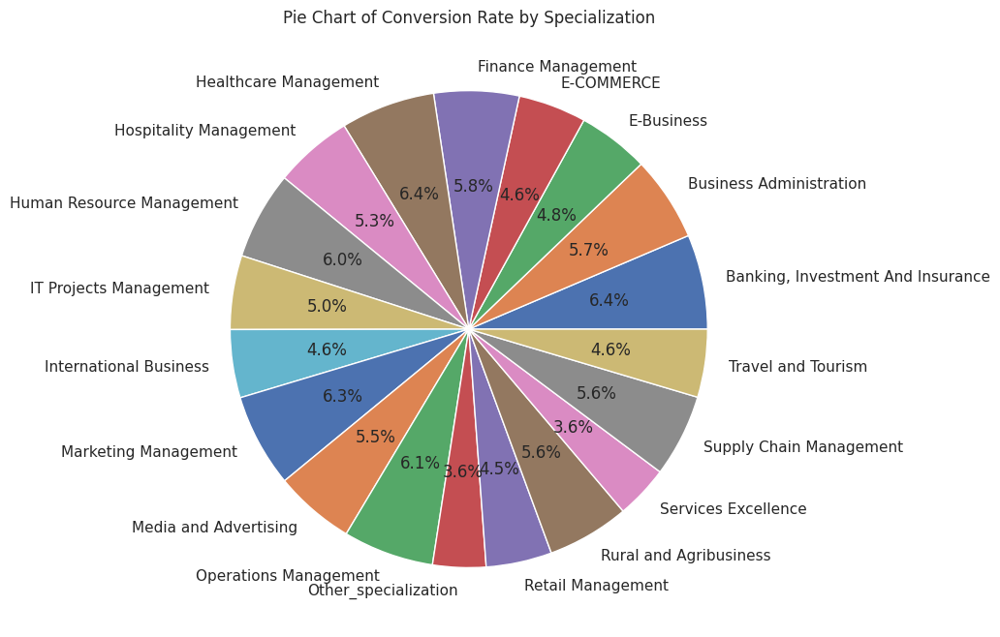

In [ ]:
# Plotting Specialization
grouped = lead.groupby('Specialization')['Converted'].mean()

plt.figure(figsize=(10, 8))
plt.pie(grouped, labels = grouped.index, autopct='%1.1f%%')
plt.title('Pie Chart of Conversion Rate by Specialization')
plt.show()

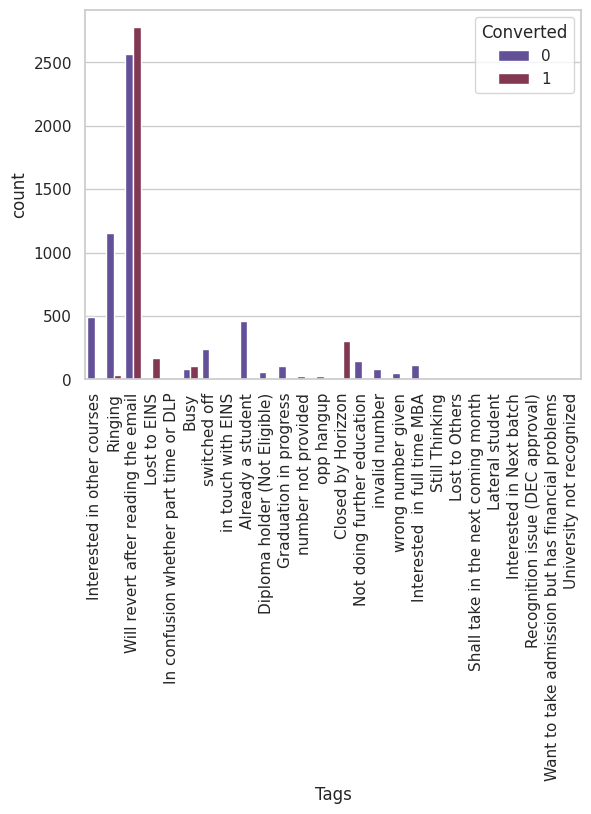

In [ ]:
# Plotting Tags
sns.countplot(x='Tags', hue='Converted', data=lead, palette='twilight')
plt.xticks(rotation=90)
plt.show()

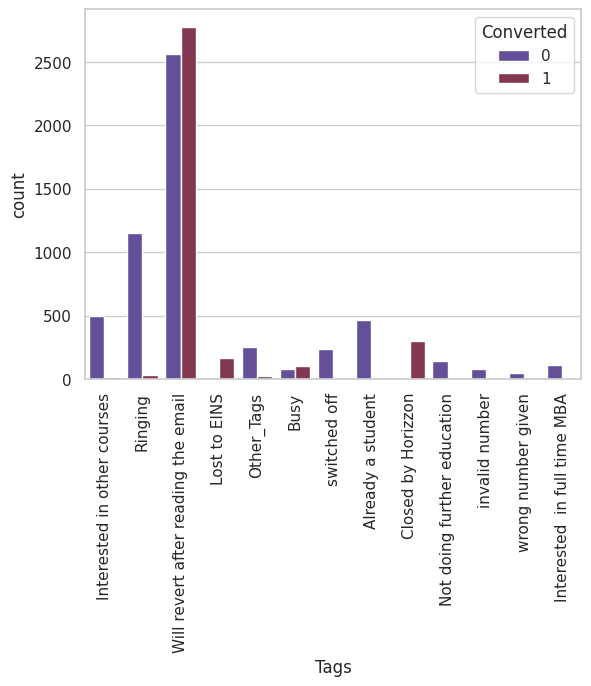

In [ ]:
# Converting all low count categories to 'Others' category
lead['Tags'] = lead['Tags'].replace(['In confusion whether part time or DLP','in touch with EINS',
                                     'Diploma holder (Not Eligible)','Approached upfront','Graduation in progress',
                                     'number not provided','opp hangup','Still Thinking','Lost to Others',
                                     'Shall take in the next coming month','Lateral student','Interested in Next batch',
                                     'Recognition issue (DEC approval)','Want to take admission but has financial problems',\
                                     'University not recognized'], 'Other_Tags')

# lets plot Tags again
sns.countplot(x='Tags', hue='Converted', data=lead, palette='twilight')
plt.xticks( rotation='vertical')
plt.show()

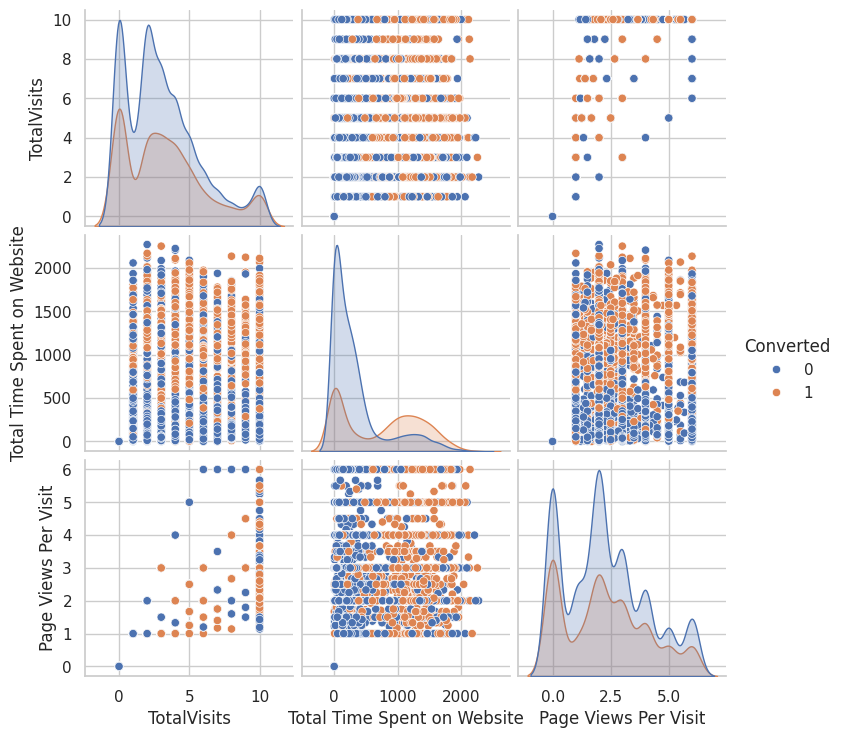

In [ ]:
# Visualising Numeric Variables
lead_nm = lead[['TotalVisits','Total Time Spent on Website','Page Views Per Visit','Converted']]
sns.pairplot(lead_nm,diag_kind='kde',hue='Converted')
plt.show()

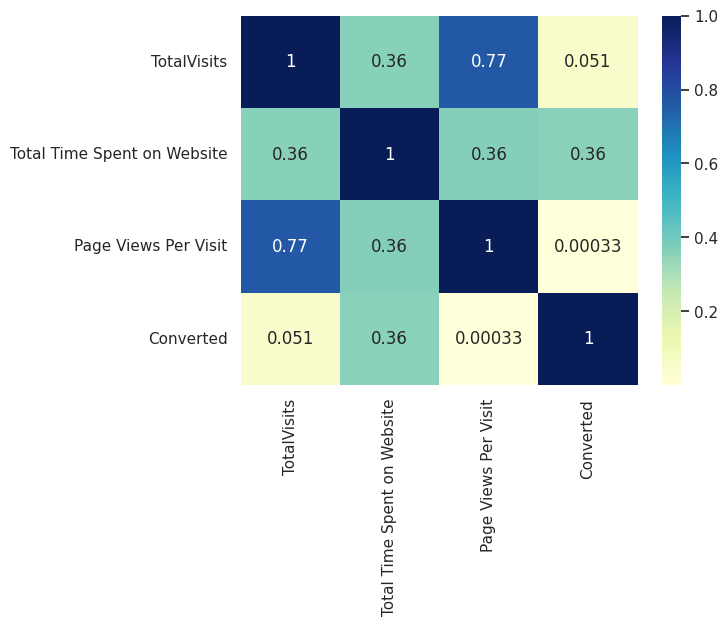

In [ ]:
# Correlation for numeric variables
cor = lead_nm.corr()

# Plot heatmap
sns.heatmap(cor, cmap="YlGnBu", annot=True)
plt.show()

In [ ]:
# Dropping unnecessary columns
lead = lead.drop(['Lead Number','Do Not Call','Country','What matters most to you in choosing a course',
                  'Search', 'Magazine', 'Newspaper Article','X Education Forums', 'Newspaper','Digital Advertisement',
                  'Through Recommendations','Receive More Updates About Our Courses', 'Update me on Supply Chain Content',
                  'Get updates on DM Content','I agree to pay the amount through cheque',
                  'A free copy of Mastering The Interview'], axis=1)

lead.head()

,Prospect ID,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,Tags,Lead Quality,City,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,API,Olark Chat,0,0,0.0,0,0.0,Page Visited on Website,Other_specialization,Unemployed,Interested in other courses,Low in Relevance,Mumbai,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,API,Organic Search,0,0,5.0,674,2.5,Email Opened,Other_specialization,Unemployed,Ringing,Not Sure,Mumbai,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,Landing Page Submission,Direct Traffic,0,1,2.0,1532,2.0,Email Opened,Business Administration,Student,Will revert after reading the email,Might be,Mumbai,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,Landing Page Submission,Direct Traffic,0,0,1.0,305,1.0,Unreachable,Media and Advertising,Unemployed,Ringing,Not Sure,Mumbai,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,Landing Page Submission,Google,0,1,2.0,1428,1.0,Converted to Lead,Other_specialization,Unemployed,Will revert after reading the email,Might be,Mumbai,Modified


In [ ]:
lead.shape

(9074, 15)

### Step 4: Dummy Variable Creation

In [ ]:
# Creating a dummy variable for the categorical variables and dropping the first one.
dummy = pd.get_dummies(lead[['Lead Origin','Lead Source','Last Activity','Specialization','What is your current occupation',
                             'Tags','City','Last Notable Activity','Lead Quality']], drop_first=True, dtype=int)

#### Dropping the repeated variables

In [ ]:
# We have created dummies for the below variables, so we can drop them
lead = lead.drop(['Lead Origin','Lead Source','Last Activity','Specialization','What is your current occupation','Tags','City',
                  'Last Notable Activity', 'Lead Quality'], axis=1)

lead.head()

,Prospect ID,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,0,0,0.0,0,0.0
1,2a272436-5132-4136-86fa-dcc88c88f482,0,0,5.0,674,2.5
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,0,1,2.0,1532,2.0
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,0,0,1.0,305,1.0
4,3256f628-e534-4826-9d63-4a8b88782852,0,1,2.0,1428,1.0


In [ ]:
# Adding the results to the master dataframe
lead = pd.concat([lead, dummy], axis=1)
lead.head()

,Prospect ID,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Other_Source,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Olark Chat Conversation,Last Activity_Other_Activity,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Other_specialization,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,Tags_Busy,Tags_Closed by Horizzon,Tags_Interested in full time MBA,Tags_Interested in other courses,Tags_Lost to EINS,Tags_Not doing further education,Tags_Other_Tags,Tags_Ringing,Tags_Will revert after reading the email,Tags_invalid number,Tags_switched off,Tags_wrong number given,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked,Lead Quality_Low in Relevance,Lead Quality_Might be,Lead Quality_Not Sure,Lead Quality_Worst
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,0,0,0.0,0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0
1,2a272436-5132-4136-86fa-dcc88c88f482,0,0,5.0,674,2.5,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,0,1,2.0,1532,2.0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,0,0,1.0,305,1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0
4,3256f628-e534-4826-9d63-4a8b88782852,0,1,2.0,1428,1.0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0


### Step 5: Test-Train Split

In [ ]:
# Putting feature variable to X
X = lead.drop(['Prospect ID', 'Converted'], axis=1)

X.head()

,Do Not Email,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Other_Source,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Olark Chat Conversation,Last Activity_Other_Activity,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Other_specialization,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,Tags_Busy,Tags_Closed by Horizzon,Tags_Interested in full time MBA,Tags_Interested in other courses,Tags_Lost to EINS,Tags_Not doing further education,Tags_Other_Tags,Tags_Ringing,Tags_Will revert after reading the email,Tags_invalid number,Tags_switched off,Tags_wrong number given,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked,Lead Quality_Low in Relevance,Lead Quality_Might be,Lead Quality_Not Sure,Lead Quality_Worst
0,0,0.0,0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0
1,0,5.0,674,2.5,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,0,2.0,1532,2.0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,0,1.0,305,1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0
4,0,2.0,1428,1.0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0


In [ ]:
# Putting response variable to y
y = lead['Converted']

y.head()

,Converted
0,0
1,0
2,1
3,0
4,1


In [ ]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, test_size=0.2, random_state=100)

### Step 6: Feature Scaling

In [ ]:
scaler = StandardScaler()

X_train[['TotalVisits','Total Time Spent on Website','Page Views Per Visit']] = scaler.fit_transform(X_train[['TotalVisits','Total Time Spent on Website','Page Views Per Visit']])

X_train.head()

,Do Not Email,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Other_Source,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Olark Chat Conversation,Last Activity_Other_Activity,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Other_specialization,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,Tags_Busy,Tags_Closed by Horizzon,Tags_Interested in full time MBA,Tags_Interested in other courses,Tags_Lost to EINS,Tags_Not doing further education,Tags_Other_Tags,Tags_Ringing,Tags_Will revert after reading the email,Tags_invalid number,Tags_switched off,Tags_wrong number given,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked,Lead Quality_Low in Relevance,Lead Quality_Might be,Lead Quality_Not Sure,Lead Quality_Worst
160,0,-0.071614,0.961655,0.405994,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2267,0,-1.147903,-0.886605,-1.263716,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
8895,0,-1.147903,-0.886605,-1.263716,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
854,0,0.287149,2.136489,0.962564,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3640,0,0.287149,-0.505974,0.962564,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [ ]:
# Checking the Conversion Rate
convert = (sum(lead['Converted'])/len(lead['Converted'].index))*100
print(convert)

37.85541106458012


We have almost 38% conversion rate

### Step 7: Looking at Correlations

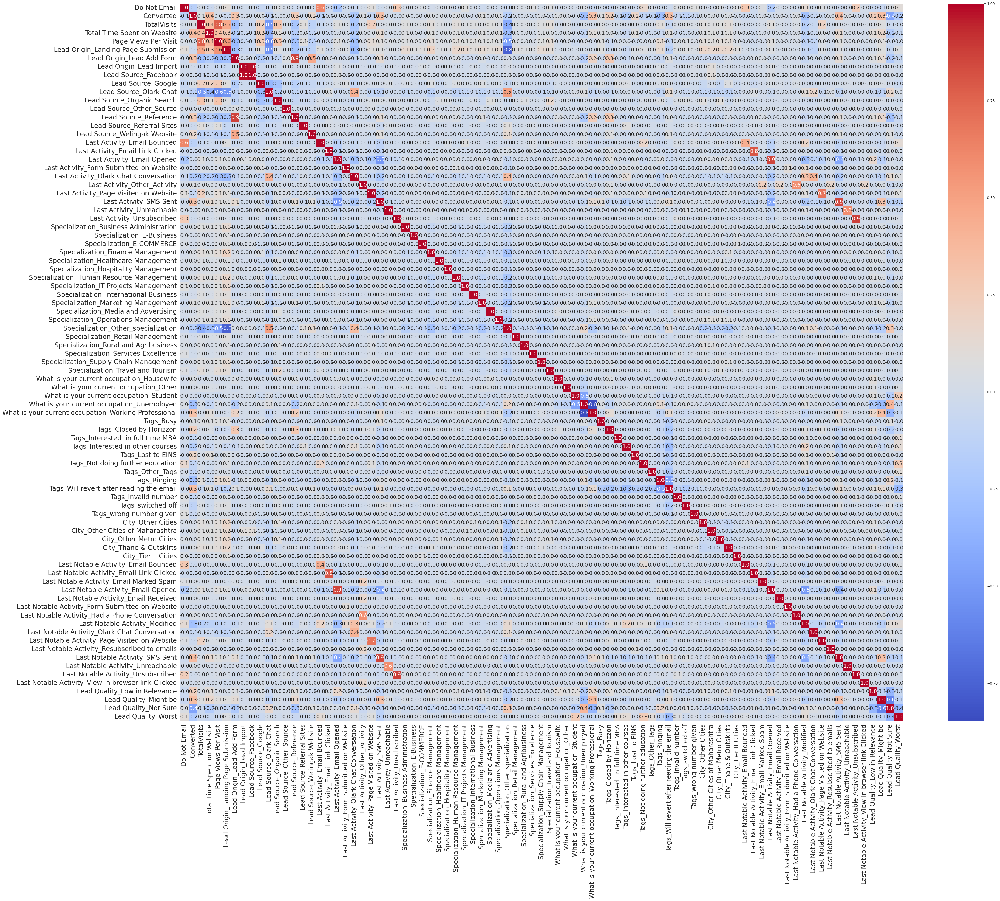

In [ ]:
# Excluding the non-numeric 'Prospect ID' column
num_lead = lead.drop(columns=['Prospect ID'])

# Let's see the correlation matrix
plt.figure(figsize = (50,40))        # Size of the figure
sns.heatmap(num_lead.corr(), annot=True, fmt='.1f', annot_kws={'size': 16}, cmap='coolwarm')
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.show()

In [ ]:
# Dropping the highly correlated dummy variables
X_test = X_test.drop(['Lead Source_Facebook','Last Notable Activity_Unsubscribed','Last Notable Activity_SMS Sent',
                      'Last Notable Activity_Email Opened','Last Notable Activity_Unreachable',
                      'Last Notable Activity_Email Link Clicked','Last Notable Activity_Page Visited on Website'], axis=1)

X_train = X_train.drop(['Lead Source_Facebook','Last Notable Activity_Unsubscribed','Last Notable Activity_SMS Sent',
                        'Last Notable Activity_Email Opened','Last Notable Activity_Unreachable',
                        'Last Notable Activity_Email Link Clicked','Last Notable Activity_Page Visited on Website'], axis=1)

#### Checking the Correlation Matrix

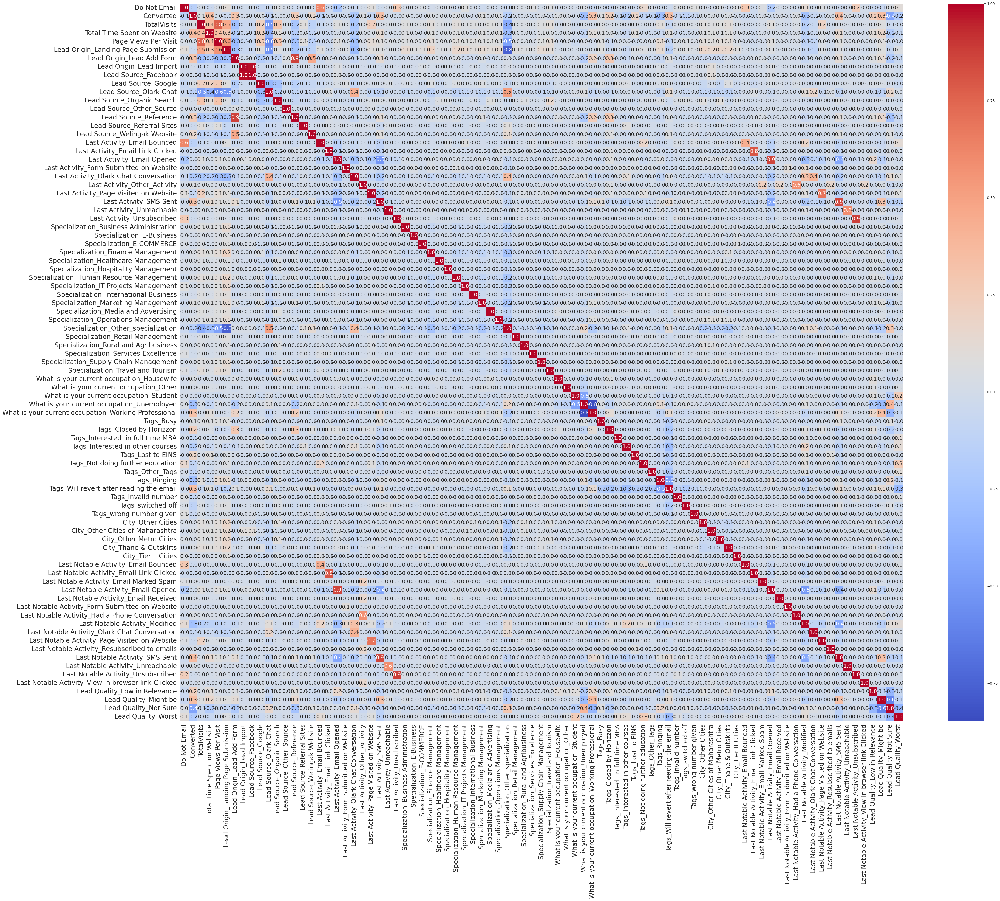

In [ ]:
# After dropping highly correlated variables now let's check the correlation matrix again
plt.figure(figsize = (50,40))
sns.heatmap(num_lead.corr(), annot=True, fmt='.1f', annot_kws={'size': 16}, cmap='coolwarm')
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.show()

### Step 8: Model Building

#### Running Our First Training Model

In [ ]:
# Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 7259
Model:                            GLM   Df Residuals:                     7181
Model Family:                Binomial   Df Model:                           77
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1478.5
Date:                Tue, 24 Sep 2024   Deviance:                       2957.0
Time:                        16:00:27   Pearson chi2:                 5.36e+04
No. Iterations:                    24   Pseudo R-squ. (CS):             0.6021
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                    1.3531      1.711      0.791      0.429      -2.001       4.707
Do Not Email                                            -1.1627      0.286     -4.058      0.000      -1.724      -0.601
TotalVisits                                              0.1720      0.078      2.202      0.028       0.019       0.325
Total Time Spent on Website                              1.1023      0.058     19.013      0.000       0.989       1.216
Page Views Per Visit                                    -0.3206      0.089     -3.585      0.000      -0.496      -0.145
Lead Origin_Landing Page Submission                     -0.9103      0.203     -4.474      0.000      -1.309      -0.512
Lead Origin_Lead Add Form                               -0.2959      1.312     -0.226      0.822      -2.867       2.275
Lead Origin_Lead Import                                  0.7603      0.782      0.972      0.331      -0.773       2.294
Lead Source_Google                                       0.2181      0.141      1.543      0.123      -0.059       0.495
Lead Source_Olark Chat                                   0.8697      0.214      4.069      0.000       0.451       1.289
Lead Source_Organic Search                               0.2966      0.191      1.552      0.121      -0.078       0.671
Lead Source_Other_Source                                 0.8100      0.805      1.006      0.314      -0.768       2.388
Lead Source_Reference                                    1.5788      1.361      1.160      0.246      -1.089       4.247
Lead Source_Referral Sites                              -0.0580      0.432     -0.134      0.893      -0.904       0.788
Lead Source_Welingak Website                             5.3451      1.508      3.544      0.000       2.389       8.301
Last Activity_Email Bounced                             -0.5671      0.741     -0.766      0.444      -2.019       0.884
Last Activity_Email Link Clicked                        -0.8485      0.430     -1.975      0.048      -1.690      -0.007
Last Activity_Email Opened                              -0.3555      0.327     -1.088      0.277      -0.996       0.285
Last Activity_Form Submitted on Website                  0.2823      0.558      0.506      0.613      -0.811       1.375
Last Activity_Olark Chat Conversation                   -0.5504      0.368     -1.496      0.135      -1.272       0.171
Last Activity_Other_Activity                             1.4462      1.168      1.239      0.215      -0.842       3.735
Last Activity_Page Visited on Website                   -0.4643      0.375     -1.238      0.216      -1.199       0.271
Last Activity_SMS Sent                                   1

### Step 9: Feature Selection Using RFE

In [ ]:
logreg = LogisticRegression()
rfe = RFE(estimator=logreg, n_features_to_select=15)
rfe = rfe.fit(X_train, y_train)

In [ ]:
rfe.support_

array([ True, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True,  True,  True, False, False,  True, False, False,
        True,  True,  True,  True, False, False, False, False, False,
       False, False, False, False, False, False,  True,  True, False,
       False, False, False,  True,  True])

In [ ]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('Do Not Email', True, 1),
 ('TotalVisits', False, 42),
 ('Total Time Spent on Website', False, 5),
 ('Page Views Per Visit', False, 38),
 ('Lead Origin_Landing Page Submission', False, 12),
 ('Lead Origin_Lead Add Form', False, 2),
 ('Lead Origin_Lead Import', False, 23),
 ('Lead Source_Google', False, 36),
 ('Lead Source_Olark Chat', False, 4),
 ('Lead Source_Organic Search', False, 37),
 ('Lead Source_Other_Source', False, 34),
 ('Lead Source_Reference', False, 39),
 ('Lead Source_Referral Sites', False, 52),
 ('Lead Source_Welingak Website', True, 1),
 ('Last Activity_Email Bounced', False, 27),
 ('Last Activity_Email Link Clicked', False, 21),
 ('Last Activity_Email Opened', False, 26),
 ('Last Activity_Form Submitted on Website', False, 32),
 ('Last Activity_Olark Chat Conversation', False, 22),
 ('Last Activity_Other_Activity', False, 7),
 ('Last Activity_Page Visited on Website', False, 25),
 ('Last Activity_SMS Sent', True, 1),
 ('Last Activity_Unreachable', False, 9),
 ('Las

In [ ]:
col = X_train.columns[rfe.support_]

In [ ]:
X_train.columns[rfe.support_]

Index(['Do Not Email', 'Lead Source_Welingak Website',
       'Last Activity_SMS Sent',
       'What is your current occupation_Working Professional', 'Tags_Busy',
       'Tags_Closed by Horizzon', 'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_invalid number',
       'Tags_switched off', 'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Conversation',
       'Lead Quality_Not Sure', 'Lead Quality_Worst'],
      dtype='object')

#### Assessing the model with StatsModels

In [ ]:
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 7259
Model:                            GLM   Df Residuals:                     7243
Model Family:                Binomial   Df Model:                           15
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1768.5
Date:                Tue, 24 Sep 2024   Deviance:                       3537.0
Time:                        16:00:36   Pearson chi2:                 4.27e+04
No. Iterations:                    23   Pseudo R-squ. (CS):             0.5690
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -1.2231      0.204     -6.009      0.000      -1.622      -0.824
Do Not Email                                            -1.0972      0.202     -5.421      0.000      -1.494      -0.701
Lead Source_Welingak Website                             4.1723      0.733      5.690      0.000       2.735       5.609
Last Activity_SMS Sent                                   2.0029      0.096     20.818      0.000       1.814       2.192
What is your current occupation_Working Professional     1.3785      0.276      5.002      0.000       0.838       1.919
Tags_Busy                                                3.4683      0.300     11.542      0.000       2.879       4.057
Tags_Closed by Horizzon                                  8.6146      0.763     11.288      0.000       7.119      10.110
Tags_Lost to EINS                                        9.1179      0.641     14.224      0.000       7.862      10.374
Tags_Ringing                                            -1.8217      0.303     -6.005      0.000      -2.416      -1.227
Tags_Will revert after reading the email                 3.6250      0.214     16.933      0.000       3.205       4.045
Tags_invalid number                                    -22.2372   1.26e+04     -0.002      0.999   -2.46e+04    2.46e+04
Tags_switched off                                       -2.5813      0.572     -4.511      0.000      -3.703      -1.460
Last Notable Activity_Modified                          -1.7288      0.100    -17.219      0.000      -1.926      -1.532
Last Notable Activity_Olark Chat Conversation           -1.4936      0.347     -4.303      0.000      -2.174      -0.813
Lead Quality_Not Sure                                   -3.3235      0.122    -27.146      0.000      -3.563      -3.084
Lead Quality_Worst                                      -3.8829      0.736     -5.273      0.000      -5.326      -2.440
========================================================================================================================
"""

In [ ]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

,0
160,0.916971
2267,0.082018
8895,0.987929
854,0.916971
3640,0.284628
7090,0.012550
4366,0.284628
6174,0.001075
857,0.065962
7264,0.065962


In [ ]:
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.916971  , 0.08201813, 0.98792914, 0.916971  , 0.28462768,
       0.0125503 , 0.28462768, 0.0010745 , 0.06596243, 0.06596243])

#### Creating a dataframe with the true conversion status and the predicted probabilities

In [ ]:
y_train_pred_final = pd.DataFrame({'Convert':y_train.values, 'Convert_Prob':y_train_pred})
y_train_pred_final['ProsID'] = y_train.index
y_train_pred_final.head()

,Convert,Convert_Prob,ProsID
0,1,0.916971,160
1,0,0.082018,2267
2,1,0.987929,8895
3,1,0.916971,854
4,0,0.284628,3640


#### Creating new column 'predicted' with 1 if Convert_Prob > 0.5 else 0

In [ ]:
y_train_pred_final['predicted'] = y_train_pred_final.Convert_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,Convert,Convert_Prob,ProsID,predicted
0,1,0.916971,160,1
1,0,0.082018,2267,0
2,1,0.987929,8895,1
3,1,0.916971,854,1
4,0,0.284628,3640,0


In [ ]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_train_pred_final.Convert, y_train_pred_final.predicted)
print(confusion)

[[4330  165]
 [ 413 2351]]


In [ ]:
# Let's check the overall accuracy
print(metrics.accuracy_score(y_train_pred_final.Convert, y_train_pred_final.predicted))

0.9203747072599532


#### Checking VIFs

In [ ]:
# Creating a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
13,Lead Quality_Not Sure,3.18
8,Tags_Will revert after reading the email,2.88
11,Last Notable Activity_Modified,1.69
2,Last Activity_SMS Sent,1.62
7,Tags_Ringing,1.54
3,What is your current occupation_Working Profes...,1.24
14,Lead Quality_Worst,1.13
0,Do Not Email,1.12
4,Tags_Busy,1.11
10,Tags_switched off,1.10


All variables have acceptable VIF values. However, due to the previously observed high p-values for the columns `Tags_invalid number` and `Tags_wrong number given`, we have decided to drop these columns and adjust the model accordingly. We will start by dropping the `Tags_invalid` number column first and evaluate the changes.

In [ ]:
col = col.drop('Tags_invalid number')
col

Index(['Do Not Email', 'Lead Source_Welingak Website',
       'Last Activity_SMS Sent',
       'What is your current occupation_Working Professional', 'Tags_Busy',
       'Tags_Closed by Horizzon', 'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_switched off',
       'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Conversation',
       'Lead Quality_Not Sure', 'Lead Quality_Worst'],
      dtype='object')

In [ ]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 7259
Model:                            GLM   Df Residuals:                     7244
Model Family:                Binomial   Df Model:                           14
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1774.5
Date:                Tue, 24 Sep 2024   Deviance:                       3549.1
Time:                        16:00:37   Pearson chi2:                 4.19e+04
No. Iterations:                     8   Pseudo R-squ. (CS):             0.5683
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -1.3729      0.204     -6.742      0.000      -1.772      -0.974
Do Not Email                                            -1.0898      0.202     -5.396      0.000      -1.486      -0.694
Lead Source_Welingak Website                             4.1706      0.733      5.690      0.000       2.734       5.607
Last Activity_SMS Sent                                   1.9801      0.096     20.696      0.000       1.793       2.168
What is your current occupation_Working Professional     1.4089      0.278      5.071      0.000       0.864       1.953
Tags_Busy                                                3.6259      0.299     12.110      0.000       3.039       4.213
Tags_Closed by Horizzon                                  8.7502      0.763     11.463      0.000       7.254      10.246
Tags_Lost to EINS                                        9.2596      0.642     14.426      0.000       8.002      10.518
Tags_Ringing                                            -1.6555      0.302     -5.485      0.000      -2.247      -1.064
Tags_Will revert after reading the email                 3.7724      0.214     17.624      0.000       3.353       4.192
Tags_switched off                                       -2.4123      0.571     -4.223      0.000      -3.532      -1.293
Last Notable Activity_Modified                          -1.7172      0.100    -17.133      0.000      -1.914      -1.521
Last Notable Activity_Olark Chat Conversation           -1.4942      0.347     -4.306      0.000      -2.174      -0.814
Lead Quality_Not Sure                                   -3.3173      0.122    -27.157      0.000      -3.557      -3.078
Lead Quality_Worst                                      -3.9234      0.732     -5.363      0.000      -5.357      -2.490
========================================================================================================================
"""

In [ ]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)
y_train_pred[:10]

array([9.16793439e-01, 8.22690766e-02, 9.87625046e-01, 9.16793439e-01,
       2.85414862e-01, 1.25469903e-02, 2.85414862e-01, 8.98883803e-04,
       6.69216493e-02, 6.69216493e-02])

In [ ]:
y_train_pred_final['Convert_Prob'] = y_train_pred

In [ ]:
# Creating new column 'predicted' with 1 if Convert_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Convert_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Convert,Convert_Prob,ProsID,predicted
0,1,0.916793,160,1
1,0,0.082269,2267,0
2,1,0.987625,8895,1
3,1,0.916793,854,1
4,0,0.285415,3640,0


In [ ]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Convert, y_train_pred_final.predicted))

0.9198236671717868


Overall, the accuracy has not decreased significantly.

#### Let's check the VIFs again


In [ ]:
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
12,Lead Quality_Not Sure,3.12
8,Tags_Will revert after reading the email,2.83
10,Last Notable Activity_Modified,1.69
2,Last Activity_SMS Sent,1.61
7,Tags_Ringing,1.52
3,What is your current occupation_Working Profes...,1.24
13,Lead Quality_Worst,1.13
0,Do Not Email,1.12
4,Tags_Busy,1.11
9,Tags_switched off,1.10


The VIF values remain largely unchanged. However, the column `Tags_wrong number given` continues to show a high p-value. Thus, we will proceed by removing this variable.

In [ ]:
col = col.drop('Tags_wrong number given')
col

KeyError: "['Tags_wrong number given'] not found in axis"

In [ ]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm4 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm4.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 7259
Model:                            GLM   Df Residuals:                     7244
Model Family:                Binomial   Df Model:                           14
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1774.5
Date:                Tue, 24 Sep 2024   Deviance:                       3549.1
Time:                        16:13:09   Pearson chi2:                 4.19e+04
No. Iterations:                     8   Pseudo R-squ. (CS):             0.5683
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -1.3729      0.204     -6.742      0.000      -1.772      -0.974
Do Not Email                                            -1.0898      0.202     -5.396      0.000      -1.486      -0.694
Lead Source_Welingak Website                             4.1706      0.733      5.690      0.000       2.734       5.607
Last Activity_SMS Sent                                   1.9801      0.096     20.696      0.000       1.793       2.168
What is your current occupation_Working Professional     1.4089      0.278      5.071      0.000       0.864       1.953
Tags_Busy                                                3.6259      0.299     12.110      0.000       3.039       4.213
Tags_Closed by Horizzon                                  8.7502      0.763     11.463      0.000       7.254      10.246
Tags_Lost to EINS                                        9.2596      0.642     14.426      0.000       8.002      10.518
Tags_Ringing                                            -1.6555      0.302     -5.485      0.000      -2.247      -1.064
Tags_Will revert after reading the email                 3.7724      0.214     17.624      0.000       3.353       4.192
Tags_switched off                                       -2.4123      0.571     -4.223      0.000      -3.532      -1.293
Last Notable Activity_Modified                          -1.7172      0.100    -17.133      0.000      -1.914      -1.521
Last Notable Activity_Olark Chat Conversation           -1.4942      0.347     -4.306      0.000      -2.174      -0.814
Lead Quality_Not Sure                                   -3.3173      0.122    -27.157      0.000      -3.557      -3.078
Lead Quality_Worst                                      -3.9234      0.732     -5.363      0.000      -5.357      -2.490
========================================================================================================================
"""

In [ ]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)
y_train_pred[:10]

array([9.16793439e-01, 8.22690766e-02, 9.87625046e-01, 9.16793439e-01,
       2.85414862e-01, 1.25469903e-02, 2.85414862e-01, 8.98883803e-04,
       6.69216493e-02, 6.69216493e-02])

In [ ]:
y_train_pred_final['Convert_Prob'] = y_train_pred

In [ ]:
# Creating new column 'predicted' with 1 if Convert_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Convert_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Convert,Convert_Prob,ProsID,predicted
0,1,0.916793,160,1
1,0,0.082269,2267,0
2,1,0.987625,8895,1
3,1,0.916793,854,1
4,0,0.285415,3640,0


In [ ]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Convert, y_train_pred_final.predicted))

0.9198236671717868


The accuracy remains virtually unchanged.

#### Let's now check the VIFs again

In [ ]:
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
12,Lead Quality_Not Sure,3.12
8,Tags_Will revert after reading the email,2.83
10,Last Notable Activity_Modified,1.69
2,Last Activity_SMS Sent,1.61
7,Tags_Ringing,1.52
3,What is your current occupation_Working Profes...,1.24
13,Lead Quality_Worst,1.13
0,Do Not Email,1.12
4,Tags_Busy,1.11
9,Tags_switched off,1.10


All variables now show acceptable VIF and p-values, so no further variables need to be removed. We can move forward with making predictions using the current model.

In [ ]:
# Let's take a look at the confusion matrix again
confusion = metrics.confusion_matrix(y_train_pred_final.Convert, y_train_pred_final.predicted )
confusion

array([[4326,  169],
       [ 413, 2351]])

In [ ]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_train_pred_final.Convert, y_train_pred_final.predicted)

0.9198236671717868

#### Metrics beyond simply accuracy

In [ ]:
def evaluate_model(y_true, y_predicted, print_score=False):
    confusion = metrics.confusion_matrix(y_true, y_predicted)

    TP = confusion[1,1] # true positive
    TN = confusion[0,0] # true negatives
    FP = confusion[0,1] # false positives
    FN = confusion[1,0] # false negatives

    accuracy_sc = metrics.accuracy_score(y_true, y_predicted)
    sensitivity_score = TP / float(TP+FN)
    specificity_score = TN / float(TN+FP)
    precision_sc = precision_score(y_true, y_predicted)

    if print_score:
        print("Confusion Matrix :\n", confusion)
        print("Accuracy :", accuracy_sc)
        print("Sensitivity :", sensitivity_score)
        print("Specificity :", specificity_score)
        print("Precision :", precision_sc)
        return None
    else:
        return accuracy_sc, sensitivity_score, specificity_score, precision_sc

In [ ]:
# Evaluating model
evaluate_model(y_train_pred_final.Convert, y_train_pred_final.predicted, print_score=True)

Confusion Matrix :
 [[4326  169]
 [ 413 2351]]
Accuracy : 0.9198236671717868
Sensitivity : 0.8505788712011577
Specificity : 0.9624026696329254
Precision : 0.932936507936508


In [ ]:
# F1 Score
f1 = metrics.f1_score(y_train_pred_final.Convert, y_train_pred_final.predicted)
print(f'F1 Score: {f1:.2f}')

F1 Score: 0.89


In [ ]:
# AUC
auc = metrics.roc_auc_score(y_train_pred_final.Convert, y_train_pred_final.Convert_Prob)
print(f'AUC: {auc:.2f}')

AUC: 0.96


### Step 10: Plotting the ROC Curve

An ROC curve illustrates several key points:

- It displays the trade-off between sensitivity and specificity, indicating that an increase in sensitivity will result in a decrease in specificity.
- The more the curve adheres to the left-hand border and then the top border of the ROC space, the higher the accuracy of the test.
- Conversely, the closer the curve approaches the 45-degree diagonal of the ROC space, the lower the accuracy of the test.

In [ ]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [ ]:
fpr, tpr, thresholds = metrics.roc_curve(y_train_pred_final.Convert, y_train_pred_final.Convert_Prob, drop_intermediate=False)

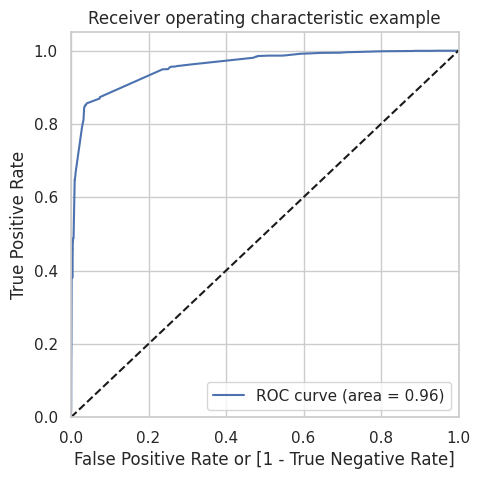

In [ ]:
draw_roc(y_train_pred_final.Convert, y_train_pred_final.Convert_Prob)

### Step 11: Finding Optimal Cutoff Point

The optimal cutoff probability is the point at which sensitivity and specificity are balanced.

In [ ]:
# Let's create columns with different probability cutoffs
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Convert_Prob.map(lambda x: 1 if x > i else 0)

y_train_pred_final.head()

,Convert,Convert_Prob,ProsID,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,1,0.916793,160,1,1,1,1,1,1,1,1,1,1,1
1,0,0.082269,2267,0,1,0,0,0,0,0,0,0,0,0
2,1,0.987625,8895,1,1,1,1,1,1,1,1,1,1,1
3,1,0.916793,854,1,1,1,1,1,1,1,1,1,1,1
4,0,0.285415,3640,0,1,1,1,0,0,0,0,0,0,0


In [ ]:
# Now let's calculate accuracy, sensitivity and specificity for various probability cutoffs
cutoff_df = pd.DataFrame(columns = ['probability','accuracy','sensitivity','specificity'])

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Convert, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1

    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     probability  accuracy  sensitivity  specificity
0.0          0.0  0.380769     1.000000     0.000000
0.1          0.1  0.805070     0.959841     0.709900
0.2          0.2  0.818019     0.956585     0.732814
0.3          0.3  0.905634     0.873010     0.925695
0.4          0.4  0.919961     0.854920     0.959956
0.5          0.5  0.919824     0.850579     0.962403
0.6          0.6  0.920650     0.850217     0.963960
0.7          0.7  0.908114     0.811143     0.967742
0.8          0.8  0.863893     0.661360     0.988432
0.9          0.9  0.860587     0.650507     0.989766


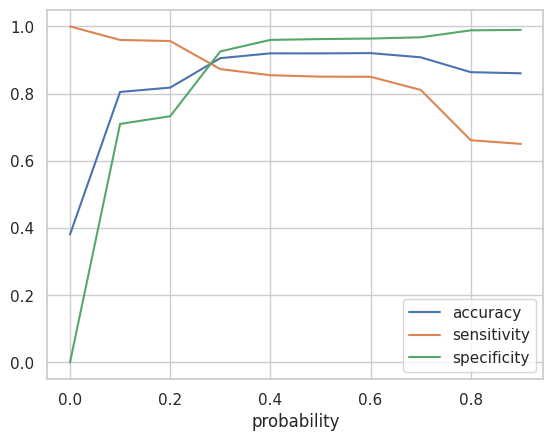

In [ ]:
# Let's plot accuracy, sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='probability', y=['accuracy','sensitivity','specificity'])
plt.show()

#### From the curve above, 0.3 is the optimum point to take it as a cutoff probability.

In [ ]:
y_train_pred_final['final_predicted'] = y_train_pred_final.Convert_Prob.map(lambda x: 1 if x > 0.3 else 0)

y_train_pred_final.head()

,Convert,Convert_Prob,ProsID,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,1,0.916793,160,1,1,1,1,1,1,1,1,1,1,1,1
1,0,0.082269,2267,0,1,0,0,0,0,0,0,0,0,0,0
2,1,0.987625,8895,1,1,1,1,1,1,1,1,1,1,1,1
3,1,0.916793,854,1,1,1,1,1,1,1,1,1,1,1,1
4,0,0.285415,3640,0,1,1,1,0,0,0,0,0,0,0,0


In [ ]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_train_pred_final.Convert, y_train_pred_final.final_predicted)

0.9056343849015016

In [ ]:
confusion2 = metrics.confusion_matrix(y_train_pred_final.Convert, y_train_pred_final.final_predicted )
confusion2

array([[4161,  334],
       [ 351, 2413]])

In [ ]:
# Evaluating model
evaluate_model(y_train_pred_final.Convert, y_train_pred_final.final_predicted, print_score=True)

Confusion Matrix :
 [[4161  334]
 [ 351 2413]]
Accuracy : 0.9056343849015016
Sensitivity : 0.8730101302460203
Specificity : 0.9256952169076752
Precision : 0.878412813978886


### Precision and Recall

In [ ]:
# Looking at the confusion matrix again
confusion = metrics.confusion_matrix(y_train_pred_final.Convert, y_train_pred_final.predicted )
confusion

array([[4326,  169],
       [ 413, 2351]])

#### Precision

In [ ]:
# Using sklearn utilities
precision_score(y_train_pred_final.Convert, y_train_pred_final.predicted)

0.932936507936508

#### Recall

In [ ]:
# Using sklearn utilities
recall_score(y_train_pred_final.Convert, y_train_pred_final.predicted)

0.8505788712011577

#### Precision and recall tradeoff

In [ ]:
p, r, thresholds = precision_recall_curve(y_train_pred_final.Convert, y_train_pred_final.Convert_Prob)

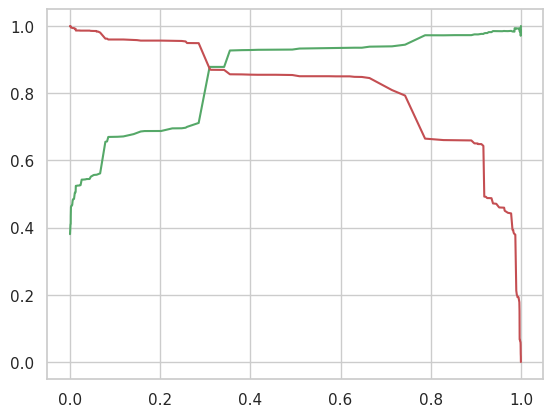

In [ ]:
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

Based on the analysis of the Sensitivity-Specificity-Accuracy plot and the Precision-Recall Curve, we have determined that a cutoff probability of `0.3` provides the best balance for our model. Consequently, we will establish `0.3` as the threshold for assigning Lead Scores in the training dataset.

In [ ]:
# Applying the optimal cutoff probability of 0.3 to classify leads and assign lead scores
y_train_pred_final = y_train_pred_final.iloc[:, :3]
y_train_pred_final['Convert_predicted'] = y_train_pred_final.Convert_Prob.map(lambda x: 1 if x > 0.3 else 0)

# Assigning Lead Scores based on the predicted conversion probabilities
y_train_pred_final['Lead_Score'] = y_train_pred_final.Convert_Prob.map(lambda x: round(x * 100))
y_train_pred_final.head()

,Convert,Convert_Prob,ProsID,Convert_predicted,Lead_Score
0,1,0.916793,160,1,92
1,0,0.082269,2267,0,8
2,1,0.987625,8895,1,99
3,1,0.916793,854,1,92
4,0,0.285415,3640,0,29


### Step 12: Making predictions on the test set

In [ ]:
X_test[['TotalVisits','Total Time Spent on Website','Page Views Per Visit']] = scaler.transform(X_test[['TotalVisits','Total Time Spent on Website','Page Views Per Visit']])

In [ ]:
X_test = X_test[col]
X_test.head()

,Do Not Email,Lead Source_Welingak Website,Last Activity_SMS Sent,What is your current occupation_Working Professional,Tags_Busy,Tags_Closed by Horizzon,Tags_Lost to EINS,Tags_Ringing,Tags_Will revert after reading the email,Tags_switched off,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Lead Quality_Not Sure,Lead Quality_Worst
3271,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1490,0,0,0,1,0,0,0,0,1,0,0,0,0,0
7936,0,0,0,0,0,0,0,0,1,0,0,0,1,0
4216,0,0,0,0,0,1,0,0,0,0,1,0,0,0
3830,0,0,0,0,0,0,0,0,1,0,0,0,1,0


In [ ]:
X_test_sm = sm.add_constant(X_test)

In [ ]:
# Making predictions on the test set
y_test_pred = res.predict(X_test_sm)
y_test_pred[:10]

,0
3271,0.285415
1490,0.978299
7936,0.285415
4216,0.996530
3830,0.285415
1800,0.978299
6507,0.012547
4821,0.000822
4223,0.987625
4714,0.341888


In [ ]:
# Converting y_test_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

# Let's see the head
y_pred_1.head()

,0
3271,0.285415
1490,0.978299
7936,0.285415
4216,0.996530
3830,0.285415


In [ ]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

In [ ]:
# Putting ProspectID to index
y_test_df['Prospect ID'] = y_test_df.index

In [ ]:
# Removing index for both dataframes to append them side by side
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [ ]:
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

y_pred_final.head()

,Converted,Prospect ID,0
0,0,3271,0.285415
1,1,1490,0.978299
2,0,7936,0.285415
3,1,4216,0.996530
4,0,3830,0.285415


In [ ]:
# Renaming the column
y_pred_final= y_pred_final.rename(columns={0: 'Convert_Prob', 'Converted': 'Convert'})

In [ ]:
# Rearranging the columns
y_pred_final = y_pred_final.reindex(['Prospect ID','Convert','Convert_Prob'], axis=1)

In [ ]:
# Let's see the head of y_pred_final
y_pred_final.head()

,Prospect ID,Convert,Convert_Prob
0,3271,0,0.285415
1,1490,1,0.978299
2,7936,0,0.285415
3,4216,1,0.996530
4,3830,0,0.285415


In [ ]:
y_pred_final['final_predicted'] = y_pred_final.Convert_Prob.map(lambda x: 1 if x > 0.3 else 0)

y_pred_final.head()

,Prospect ID,Convert,Convert_Prob,final_predicted
0,3271,0,0.285415,0
1,1490,1,0.978299,1
2,7936,0,0.285415,0
3,4216,1,0.996530,1
4,3830,0,0.285415,0


In [ ]:
# Evaluating model
evaluate_model(y_pred_final.Convert, y_pred_final.final_predicted, print_score=True)

Confusion Matrix :
 [[1057   87]
 [  99  572]]
Accuracy : 0.8975206611570248
Sensitivity : 0.8524590163934426
Specificity : 0.923951048951049
Precision : 0.8679817905918058


#### Calculating and Interpreting Metrics

#### Training Set Metrics

In [ ]:
# Evaluate model and compute metrics
train_accuracy = metrics.accuracy_score(y_train_pred_final.Convert, y_train_pred_final.Convert_predicted)
train_sensitivity = metrics.recall_score(y_train_pred_final.Convert, y_train_pred_final.Convert_predicted)
train_specificity = metrics.recall_score(y_train_pred_final.Convert, y_train_pred_final.Convert_predicted, pos_label=0)
train_precision = metrics.precision_score(y_train_pred_final.Convert, y_train_pred_final.Convert_predicted)
train_f1 = metrics.f1_score(y_train_pred_final.Convert, y_train_pred_final.Convert_predicted)
train_auc = metrics.roc_auc_score(y_train_pred_final.Convert, y_train_pred_final.Convert_Prob)

# Print summary metrics
print('Training Set Metrics:')
print(f'Accuracy: {train_accuracy:.2f}')
print(f'Sensitivity: {train_sensitivity:.2f}')
print(f'Specificity: {train_specificity:.2f}')
print(f'Precision: {train_precision:.2f}')
print(f'F1 Score: {train_f1:.2f}')
print(f'AUC: {train_auc:.2f}')

Training Set Metrics:
Accuracy: 0.91
Sensitivity: 0.87
Specificity: 0.93
Precision: 0.88
F1 Score: 0.88
AUC: 0.96


#### Test Set Metrics

In [ ]:
# Evaluate model on test set and compute metrics
test_accuracy = metrics.accuracy_score(y_pred_final.Convert, y_pred_final.final_predicted)
test_sensitivity = metrics.recall_score(y_pred_final.Convert, y_pred_final.final_predicted)
test_specificity = metrics.recall_score(y_pred_final.Convert, y_pred_final.final_predicted, pos_label=0)
test_precision = metrics.precision_score(y_pred_final.Convert, y_pred_final.final_predicted)
test_f1 = metrics.f1_score(y_pred_final.Convert, y_pred_final.final_predicted)
test_auc = metrics.roc_auc_score(y_pred_final.Convert, y_pred_final.Convert_Prob)

# Print summary metrics for test set
print('Test Set Metrics:')
print(f'Accuracy: {test_accuracy:.2f}')
print(f'Sensitivity: {test_sensitivity:.2f}')
print(f'Specificity: {test_specificity:.2f}')
print(f'Precision: {test_precision:.2f}')
print(f'F1 Score: {test_f1:.2f}')
print(f'AUC: {test_auc:.2f}')

Test Set Metrics:
Accuracy: 0.90
Sensitivity: 0.85
Specificity: 0.92
Precision: 0.87
F1 Score: 0.86
AUC: 0.95


#### Interpretation of Metrics:

- `Accuracy`: The model exhibits strong predictive accuracy, correctly classifying 91% of instances in the training set and 90% in the test set.

- `Sensitivity`: It accurately identifies 87% of actual conversions (positives) in the training set, maintaining a solid performance at 85% in the test set, which indicates reliable sensitivity across both datasets.

- `Specificity`: For non-conversions (negatives), the model demonstrates high specificity, achieving 93% accuracy in the training set and 92% in the test set. This shows its effectiveness in correctly identifying individuals who do not convert.

- `Precision`: When predicting conversions, the model is correct 88% of the time in the training set and 87% in the test set, highlighting its precision in identifying true positives.

- `F1 Score`: The harmonic mean of precision and recall is 0.88 for the training set and 0.86 for the test set, indicating a balanced performance between precision and recall.

- `AUC (Area Under Curve)`: The analysis of the ROC curve reveals an AUC of 0.96 in the training set and 0.95 in the test set, signifying excellent overall discriminatory ability between positive and negative cases.

### Step 13 : Final Model

In [ ]:
# Modified the function to include F1 score and AUC in addition to the existing metrics
def evaluate_model(y_true, y_predicted, print_score=False):
    confusion = metrics.confusion_matrix(y_true, y_predicted)

    TP = confusion[1,1] # true positive
    TN = confusion[0,0] # true negatives
    FP = confusion[0,1] # false positives
    FN = confusion[1,0] # false negatives

    accuracy_sc = metrics.accuracy_score(y_true, y_predicted)
    sensitivity_score = TP / float(TP+FN)
    specificity_score = TN / float(TN+FP)
    precision_sc = metrics.precision_score(y_true, y_predicted)
    f1_sc = metrics.f1_score(y_true, y_predicted)
    auc_sc = metrics.roc_auc_score(y_true, y_predicted)

    if print_score:
        print("Confusion Matrix :\n", confusion)
        print("Accuracy :", accuracy_sc)
        print("Sensitivity :", sensitivity_score)
        print("Specificity :", specificity_score)
        print("Precision :", precision_sc)
        print("F1 Score :", f1_sc)
        print("AUC :", auc_sc)
    else:
        return accuracy_sc, sensitivity_score, specificity_score, precision_sc, f1_sc, auc_sc

In [ ]:
# Function to build logistic regression model, evaluate, and predict
def build_logistic_regression(X_train, y_train, X_test, y_test, cutoff=0.5):
    # Train logistic regression model
    X_train_sm = sm.add_constant(X_train)
    logm = sm.GLM(y_train, X_train_sm, family=sm.families.Binomial())
    res = logm.fit()

    # Predict on training set
    y_train_pred = res.predict(X_train_sm)
    y_train_pred_final = pd.DataFrame({'Prospect ID': X_train.index, 'Converted': y_train.values, 'Convert_Probability': y_train_pred})
    y_train_pred_final['Convert_predicted'] = (y_train_pred_final.Convert_Probability > cutoff).astype(int)
    y_train_pred_final['Lead_Score'] = (y_train_pred_final.Convert_Probability * 100).round()

    # Evaluate model on training set
    print("Training Set Metrics:")
    evaluate_model(y_train_pred_final['Converted'], y_train_pred_final['Convert_predicted'], print_score=True)

    # Predict on test set
    X_test_sm = sm.add_constant(X_test)
    y_test_pred = res.predict(X_test_sm)
    y_test_pred_final = pd.DataFrame({'Prospect ID': X_test.index, 'Converted': y_test.values, 'Convert_Probability': y_test_pred})
    y_test_pred_final['Convert_predicted'] = (y_test_pred_final.Convert_Probability > cutoff).astype(int)
    y_test_pred_final['Lead_Score'] = (y_test_pred_final.Convert_Probability * 100).round()

    # Evaluate model on test set
    print("\nTest Set Metrics:")
    evaluate_model(y_test_pred_final['Converted'], y_test_pred_final['Convert_predicted'], print_score=True)

    return y_test_pred_final

In [ ]:
build_logistic_regression(X_train[col], y_train, X_test[col], y_test, cutoff=0.3)

Training Set Metrics:
Confusion Matrix :
 [[4161  334]
 [ 351 2413]]
Accuracy : 0.9056343849015016
Sensitivity : 0.8730101302460203
Specificity : 0.9256952169076752
Precision : 0.878412813978886
F1 Score : 0.875703139176193
AUC : 0.8993526735768477

Test Set Metrics:
Confusion Matrix :
 [[1057   87]
 [  99  572]]
Accuracy : 0.8975206611570248
Sensitivity : 0.8524590163934426
Specificity : 0.923951048951049
Precision : 0.8679817905918058
F1 Score : 0.8601503759398497
AUC : 0.8882050326722458


,Prospect ID,Converted,Convert_Probability,Convert_predicted,Lead_Score
3271,3271,0,0.285415,0,29.0
1490,1490,1,0.978299,1,98.0
7936,7936,0,0.285415,0,29.0
4216,4216,1,0.996530,1,100.0
3830,3830,0,0.285415,0,29.0
1800,1800,1,0.978299,1,98.0
6507,6507,0,0.012547,0,1.0
4821,4821,0,0.000822,0,0.0
4223,4223,1,0.987625,1,99.0
4714,4714,0,0.341888,1,34.0


In [ ]:
# Printing the features used in the final model
print("Features used in Final Model :", col)

Features used in Final Model : Index(['Do Not Email', 'Lead Source_Welingak Website',
       'Last Activity_SMS Sent',
       'What is your current occupation_Working Professional', 'Tags_Busy',
       'Tags_Closed by Horizzon', 'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_switched off',
       'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Conversation',
       'Lead Quality_Not Sure', 'Lead Quality_Worst'],
      dtype='object')


In [ ]:
# Printing the coefficients (feature importance)
print(res.params)

const                                                  -1.372880
Do Not Email                                           -1.089807
Lead Source_Welingak Website                            4.170618
Last Activity_SMS Sent                                  1.980073
What is your current occupation_Working Professional    1.408914
Tags_Busy                                               3.625866
Tags_Closed by Horizzon                                 8.750168
Tags_Lost to EINS                                       9.259597
Tags_Ringing                                           -1.655526
Tags_Will revert after reading the email                3.772436
Tags_switched off                                      -2.412315
Last Notable Activity_Modified                         -1.717208
Last Notable Activity_Olark Chat Conversation          -1.494151
Lead Quality_Not Sure                                  -3.317314
Lead Quality_Worst                                     -3.923369
dtype: float64


### Model Overview:

The final logistic regression model leverages historical data to forecast lead conversions into customers. By examining features such as lead origin, source, activity, and tags, the model estimates the likelihood of conversion. After training on a subset of the data, it assesses its predictions using metrics such as accuracy, sensitivity, and precision. This approach allows businesses to prioritize leads with a higher potential for conversion, thereby optimizing sales and marketing strategies for enhanced efficiency.

----

In this logistic regression model, a cutoff point of 0.3 is established for classifying leads. Any lead with a predicted probability of conversion exceeding 0.3 is categorized as likely to convert (Hot Lead), while those with probabilities below this threshold are deemed less likely to convert (Cold Lead).

Adjusting this cutoff enables a balance between identifying more potential conversions and reducing false predictions.

----

The final model incorporates a total of 13 features to predict lead conversions. These features were chosen based on their significance in influencing the likelihood of a lead converting into a customer.

----

The coefficients associated with the model highlight the key factors affecting conversion predictions, with positive values signifying an increase in the likelihood of conversion and negative values indicating a decrease.

Top Positive Influencers:
1. Tags_Lost to EINS (9.25)
2. Tags_Closed by Horizzon (8.75)
3. Lead Source_Welingak Website (4.17)

Top Negative Influencers:
1. Lead Quality_Worst (-3.92)
2. Lead Quality_Not Sure (-3.31)
3. Tags_switched off (-2.41)

----

The final model achieved a Sensitivity of 0.873, meaning it accurately identifies approximately 87% of customers who convert. Additionally, the model's Precision stands at 0.878, indicating that 88% of predicted hot leads are true hot leads. Overall, the model's Accuracy is 0.905, demonstrating it correctly classifies 90% of all cases.

----

Furthermore, we have developed a reusable code block that predicts conversion probabilities and lead scores based on provided training and test data, along with a specified cutoff value. This cutoff can be adjusted to optimize different metrics, such as sensitivity or precision, tailored to specific use cases.